In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import re

pd.set_option('display.max_columns', None)



In [2]:
movies = pd.read_fwf('zee-movies.dat',encoding = 'ISO-8859-1')
ratings = pd.read_fwf('zee-ratings.dat',encoding = 'ISO-8859-1')
users = pd.read_fwf('zee-users.dat',encoding = 'ISO-8859-1')

In [3]:
movies.head()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [4]:
movies = movies['Movie ID::Title::Genres'].str.split('::',expand=True)
movies.columns = ['movie_id','title','geners']

movies['release_year'] = movies['title'].apply(lambda x : re.findall('\([0-9]*\)',str(x)))
movies['release_year'] = movies['release_year'].apply(lambda x : re.sub('[^0-9]',"",str(x)))

display(movies[movies['release_year'].apply(lambda x : len(str(x)) >4)])

movies['release_year'] = pd.to_numeric(movies['release_year'],downcast='integer',errors='ignore')
movies['movie_id'] = movies['movie_id'].astype('int32',errors='ignore')

,movie_id,title,geners,release_year


In [5]:
display(movies.head())
display(movies.describe())
display(movies.info())

,movie_id,title,geners,release_year
0,1,Toy Story (1995),Animation|Children's|Comedy,1995.0
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995.0
2,3,Grumpier Old Men (1995),Comedy|Romance,1995.0
3,4,Waiting to Exhale (1995),Comedy|Drama,1995.0
4,5,Father of the Bride Part II (1995),Comedy,1995.0


,movie_id,release_year
count,3883.000000,3864.00000
mean,1986.049446,1986.09058
std,1146.778349,16.88945
min,1.000000,1919.00000
25%,982.500000,1982.00000
50%,2010.000000,1994.00000
75%,2980.500000,1997.00000
max,3952.000000,2000.00000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3883 entries, 0 to 3882
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   movie_id      3883 non-null   int32  
 1   title         3883 non-null   object 
 2   geners        3858 non-null   object 
 3   release_year  3864 non-null   float64
dtypes: float64(1), int32(1), object(2)
memory usage: 106.3+ KB


None

In [6]:
movies.dropna(axis=0,how='any',inplace=True)

In [7]:
display(ratings.head())

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [8]:
users = users["UserID::Gender::Age::Occupation::Zip-code"].str.split('::',expand=True)
users.columns = ['user_id','gender','age', 'occupation','zip_code']

users['user_id'] = users['user_id'].astype('int32',errors='ignore')
users['age'] = users['age'].astype('int32',errors = 'ignore')
users['occupation'] = users['occupation'].astype('int32',errors = 'ignore')

In [9]:
users['age'].replace({
                        1: "Under 18",

                        18: "18-24",

                        25: "25-34",

                        35: "35-44",

                        45: "45-49",

                        50: "50-55",

                        56: "56+"},inplace=True)

users['occupation'].replace(
                    {
                        0: "other or not specified",

                        1: "academic/educator",

                        2: "artist",

                        3: "clerical/admin",

                        4: "college/grad student",

                        5: "customer service",

                        6: "doctor/health care",

                        7: "executive/managerial",

                        8: "farmer",

                        9: "homemaker",

                        10: "K-12 student",

                        11: "lawyer",

                        12: "programmer",

                        13: "retired",

                        14: "sales/marketing",

                        15: "scientist",

                        16: "self-employed",

                        17: "technician/engineer",

                        18: "tradesman/craftsman",

                        19: "unemployed",

                        20: "writer"
                    },inplace=True)

In [10]:
display(users.head())
print("\n Users table summary\n")
display(users.describe())
print("\n User table dtype\n")
display(users.info())

,user_id,gender,age,occupation,zip_code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455



 Users table summary



,user_id
count,6040.000000
mean,3020.500000
std,1743.742145
min,1.000000
25%,1510.750000
50%,3020.500000
75%,4530.250000
max,6040.000000



 User table dtype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   user_id     6040 non-null   int32 
 1   gender      6040 non-null   object
 2   age         6040 non-null   object
 3   occupation  6040 non-null   object
 4   zip_code    6040 non-null   object
dtypes: int32(1), object(4)
memory usage: 212.5+ KB


None

In [11]:
display(ratings.head())

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [12]:
ratings = ratings["UserID::MovieID::Rating::Timestamp"].str.split('::',expand=True)
ratings.columns = ['user_id','movie_id','rating','timestamp']

ratings['user_id'] = ratings['user_id'].astype('int32',errors='ignore')
ratings['rating'] = ratings['rating'].astype('int32',errors = 'ignore')
ratings['movie_id'] = ratings['movie_id'].astype('int32',errors='ignore')

ratings['timestamp'] = pd.to_datetime(ratings['timestamp'], unit='s').dt.hour
ratings.columns = ['user_id','movie_id','rating','hour']

In [13]:
display(ratings.head())
display(ratings.describe())
display(ratings.info())

,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23


,user_id,movie_id,rating,hour
count,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06
mean,3.024512e+03,1.865540e+03,3.581564e+00,1.191620e+01
std,1.728413e+03,1.096041e+03,1.117102e+00,7.894465e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00
25%,1.506000e+03,1.030000e+03,3.000000e+00,4.000000e+00
50%,3.070000e+03,1.835000e+03,4.000000e+00,1.400000e+01
75%,4.476000e+03,2.770000e+03,4.000000e+00,1.900000e+01
max,6.040000e+03,3.952000e+03,5.000000e+00,2.300000e+01


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 4 columns):
 #   Column    Non-Null Count    Dtype
---  ------    --------------    -----
 0   user_id   1000209 non-null  int32
 1   movie_id  1000209 non-null  int32
 2   rating    1000209 non-null  int32
 3   hour      1000209 non-null  int64
dtypes: int32(3), int64(1)
memory usage: 19.1 MB


None

In [14]:
display(users.head())
display(ratings.head())
display(movies.head())

,user_id,gender,age,occupation,zip_code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23


,movie_id,title,geners,release_year
0,1,Toy Story (1995),Animation|Children's|Comedy,1995.0
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995.0
2,3,Grumpier Old Men (1995),Comedy|Romance,1995.0
3,4,Waiting to Exhale (1995),Comedy|Drama,1995.0
4,5,Father of the Bride Part II (1995),Comedy,1995.0


In [15]:
user_ratings = pd.merge(users, ratings, left_on = 'user_id', right_on = 'user_id', how = 'inner')
display(user_ratings)

,user_id,gender,age,occupation,zip_code,movie_id,rating,hour
0,1,F,Under 18,K-12 student,48067,1193,5,22
1,1,F,Under 18,K-12 student,48067,661,3,22
2,1,F,Under 18,K-12 student,48067,914,3,22
3,1,F,Under 18,K-12 student,48067,3408,4,22
4,1,F,Under 18,K-12 student,48067,2355,5,23
...,...,...,...,...,...,...,...,...
1000204,6040,M,25-34,doctor/health care,11106,1091,1,2
1000205,6040,M,25-34,doctor/health care,11106,1094,5,23
1000206,6040,M,25-34,doctor/health care,11106,562,5,23
1000207,6040,M,25-34,doctor/health care,11106,1096,4,2


In [16]:
user_movie_ratings = user_ratings.merge(movies, on = 'movie_id')

In [17]:
user_movie_ratings

,user_id,gender,age,occupation,zip_code,movie_id,rating,hour,title,geners,release_year
0,1,F,Under 18,K-12 student,48067,1193,5,22,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
1,2,M,56+,self-employed,70072,1193,5,21,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
2,12,M,25-34,programmer,32793,1193,4,23,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
3,15,M,25-34,executive/managerial,22903,1193,4,18,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
4,17,M,50-55,academic/educator,95350,1193,5,6,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
...,...,...,...,...,...,...,...,...,...,...,...
996139,5949,M,18-24,technician/engineer,47901,2198,5,18,Modulations (1998),Documentary,1998.0
996140,5675,M,35-44,sales/marketing,30030,2703,3,15,Broken Vessels (1998),Drama,1998.0
996141,5780,M,18-24,technician/engineer,92886,2845,1,17,White Boys (1999),Drama,1999.0
996142,5851,F,18-24,writer,55410,3607,5,3,One Little Indian (1973),Comedy|Drama|Western,1973.0


In [18]:
def kde_boxplot(data, x, font_size, target=None):
    plt.figure(figsize = (20,7))
    
    plt.subplot(1,2,1)
    sns.kdeplot(data = data,
                x = x,
                hue = target
               )
    if target != None:
        plt.title(label = "Distribution of "+x+" for different "+target,
                 y = -0.2,
                 fontsize = font_size,
                 fontweight = 'bold')
    else:
        plt.title(label = "Distribution of "+x, 
                 y = -0.2,
                 fontsize = font_size,
                 fontweight = 'bold')
    plt.grid()
    
    plt.subplot(1,2,2)
    sns.boxplot(data=data,
               x = target,
               y = x)

    if target != None:
        plt.title(label = "Boxplot showing distribution of "+x+" for different "+target,
                 y = -0.2,
                 fontsize = font_size,
                 fontweight = 'bold')
        if df_grouped['City'].nunique() > 5:
            plt.xticks(rotation = 75)
    else:
        plt.title(label = "Boxplot showing distribution of "+x,
                 y = -0.2,
                 fontsize = font_size,
                 fontweight = 'bold')
    plt.grid(which='both')
    plt.show()

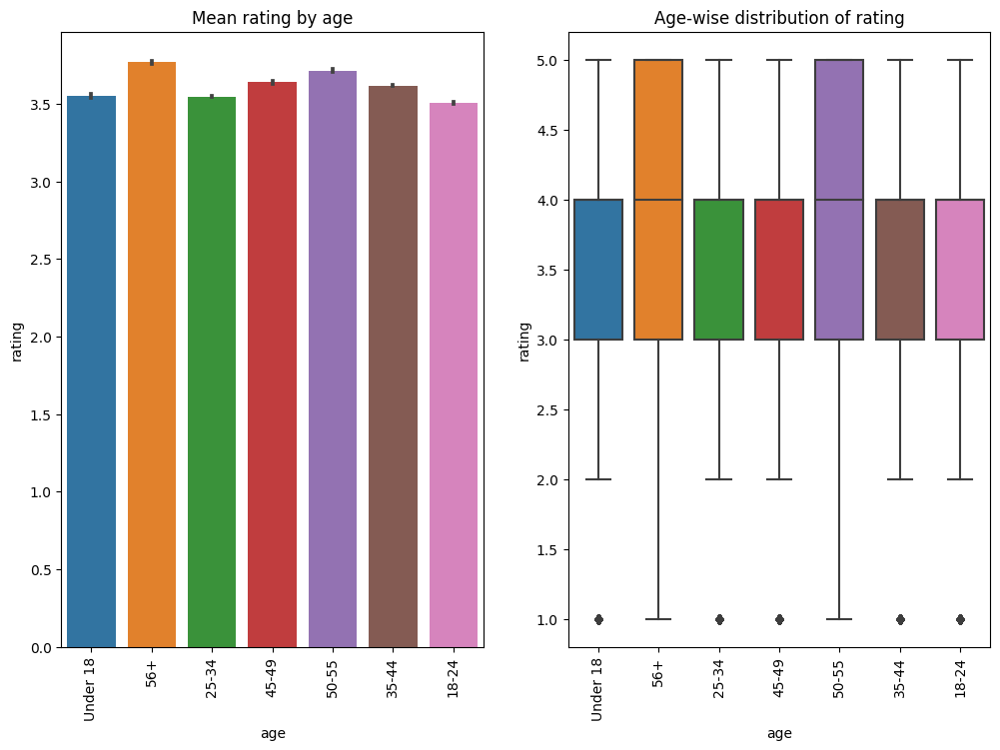

In [19]:
plt.figure(figsize = (12,8))
plt.subplot(1,2,1)
sns.barplot(data=user_ratings, x = 'age', y = 'rating',estimator=np.mean)
plt.xticks(rotation=90)
plt.title('Mean rating by age')

plt.subplot(1,2,2)
sns.boxplot(data=user_ratings, x = 'age',  y= 'rating')
plt.xticks(rotation=90)
plt.title('Age-wise distribution of rating')

plt.show()

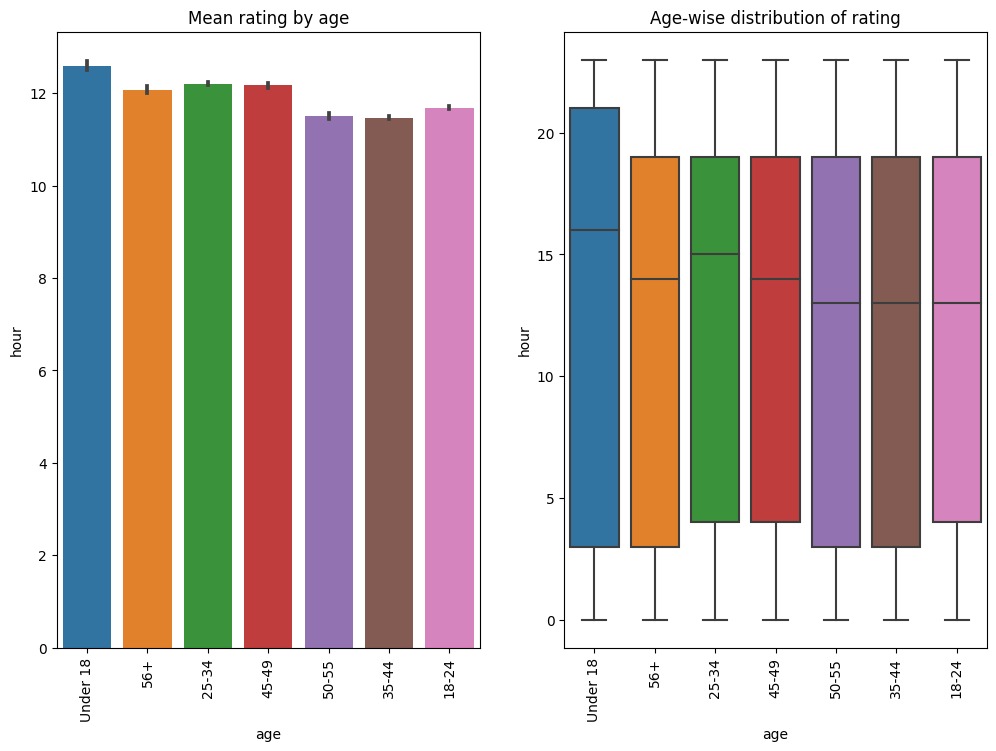

In [20]:
plt.figure(figsize = (12,8))
plt.subplot(1,2,1)
sns.barplot(data=user_ratings, x = 'age', y = 'hour',estimator=np.mean)
plt.xticks(rotation=90)
plt.title('Mean rating by age')

plt.subplot(1,2,2)
sns.boxplot(data=user_ratings, x = 'age',  y= 'hour')
plt.xticks(rotation=90)
plt.title('Age-wise distribution of rating')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


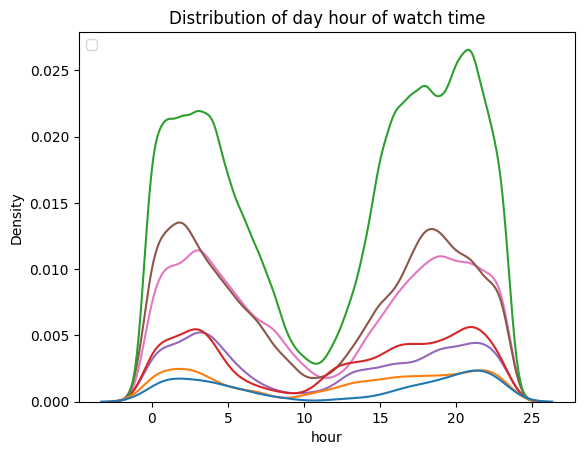

In [21]:
sns.kdeplot(data=user_ratings, x = 'hour',hue='age',legend=True)
plt.title('Distribution of day hour of watch time')
plt.legend(loc= 'upper left')
plt.show()

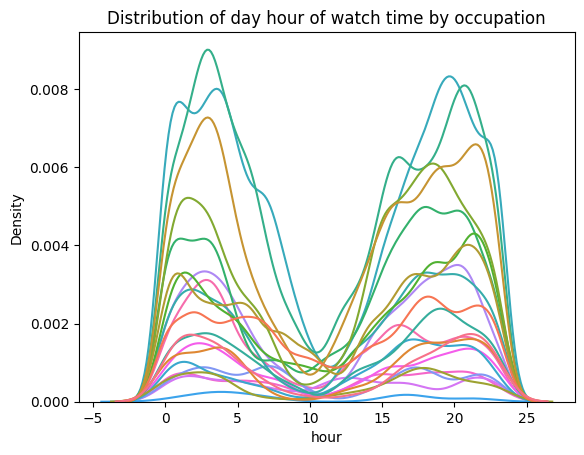

In [22]:
sns.kdeplot(data=user_ratings, x = 'hour',hue='occupation',legend=False)
plt.title('Distribution of day hour of watch time by occupation')
plt.show()

In [23]:
display(users.head())
display(ratings.head())
display(movies.head())

,user_id,gender,age,occupation,zip_code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23


,movie_id,title,geners,release_year
0,1,Toy Story (1995),Animation|Children's|Comedy,1995.0
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995.0
2,3,Grumpier Old Men (1995),Comedy|Romance,1995.0
3,4,Waiting to Exhale (1995),Comedy|Drama,1995.0
4,5,Father of the Bride Part II (1995),Comedy,1995.0


---

In [24]:
geners = movies.copy()
geners['geners'] = geners['geners'].str.split('|')
geners = geners.explode('geners')
a = ~geners.pivot(index='movie_id',columns = 'geners',values = 'title').isna()
a = a.astype(int)

In [25]:
a

geners,,A,Acti,Action,Adv,Advent,Adventu,Adventur,Adventure,Animati,Animation,Chi,Chil,Childr,Childre,Children,Children',Children's,Com,Come,Comed,Comedy,Crime,D,Docu,Documen,Document,Documenta,Documentary,Dr,Dram,Drama,F,Fant,Fantas,Fantasy,Film-Noir,Horr,Horro,Horror,Music,Musical,Mystery,R,Ro,Rom,Roma,Roman,Romance,S,Sci,Sci-,Sci-F,Sci-Fi,Th,Thri,Thrille,Thriller,Wa,War,We,Wester,Western
movie_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3948,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3949,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3950,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [26]:
dic = {'a':'action', 'acti':'action','adv':'adventure', 'advent':'adventure', 'adventu':'adventure', 'adventur':'adventure',
       'animati':'animation', 'chi':'children','chil':'children', 'childr':'children', 'childre':'children',
       'children':'children',"children's":'children', 'com':'comedy', 'come':'comedy', 'comed':'comedy',
       'd':'documentary', 'docu':'documentary', 'documen':'documentary', 'document':'documentary', 'documenta':'documentary',
       'dr':'drama', 'dram':'drama', 'f':'fantasy', 'fant':'fantasy', 'fantas':'fantasy', 
       'horr':'horror', 'horro':'horror', 'music':'musical', 'r':'romance', 'ro':'romance',
       'rom':'romance', 'roma':'romance', 'roman':'romance', 's':'sci-fi', 'sci':'sci-fi', 'sci-':'sci-fi', 'sci-f':'sci-fi',
       'th':'thriller', 'thri':'thriller', 'thrille':'thriller', 'wa':'western', 'war':'western', 'we':'western',
       'wester':'western',"children'":'children' }

In [27]:
movies['geners'] = movies['geners'].apply(lambda x : str(x).lower())

In [28]:
ratings

,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23
...,...,...,...,...
1000204,6040,1091,1,2
1000205,6040,1094,5,23
1000206,6040,562,5,23
1000207,6040,1096,4,2


In [29]:
#Cleaning movies dataframe further
temp = movies.copy()
temp['geners'] = temp['geners'].str.split('|')
temp = temp.explode('geners')
temp['geners'].replace(dic,inplace=True)
movies = temp
movies = movies[~movies.duplicated()]
print(f" {'*' * 50} {'Movies DataFrame'} {'*' * 50}")
display(movies)

geners = movies.copy()
geners = ~geners.pivot(index='title',columns = 'geners',values = 'title').isna()
geners = geners.astype(int)
print(f" {'*' * 50} {'Geners DataFrame'} {'*' * 50}")
display(geners)

geners_movies = geners.merge(movies,on = 'title').drop('geners',axis=1)
temp = geners_movies.merge(ratings, on = 'movie_id')
df_final = temp.merge(users, on = 'user_id')
df_final = df_final[['user_id','title','release_year','rating','hour','age',
               'gender','occupation','zip_code','action', 'adventure', 'animation', 'children',
               'comedy', 'crime', 'documentary', 'drama', 'fantasy', 'film-noir',
               'horror', 'musical', 'mystery', 'romance', 'sci-fi', 'thriller',
               'western']]
df_final = df_final[~df_final.duplicated()]
df_final.reset_index(drop=True, inplace=True)
print(f" {'*' * 50} {'DataFrame : df_final'} {'*' * 50}")
display(df_final)

# df = users.merge(ratings, on = 'user_id')
# df = df.merge(movies, on = 'title')
# df.sort_values(by = 'user_id',inplace=True,ignore_index=True)
# print(f" {'*' * 50} {'DataFrame : df'} {'*' * 50}")
# display(df)

 ************************************************** Movies DataFrame **************************************************


,movie_id,title,geners,release_year
0,1,Toy Story (1995),animation,1995.0
0,1,Toy Story (1995),children,1995.0
0,1,Toy Story (1995),comedy,1995.0
1,2,Jumanji (1995),adventure,1995.0
1,2,Jumanji (1995),children,1995.0
...,...,...,...,...
3879,3949,Requiem for a Dream (2000),drama,2000.0
3880,3950,Tigerland (2000),drama,2000.0
3881,3951,Two Family House (2000),drama,2000.0
3882,3952,"Contender, The (2000)",drama,2000.0


 ************************************************** Geners DataFrame **************************************************


geners,,action,adventure,animation,children,comedy,crime,documentary,drama,fantasy,film-noir,horror,musical,mystery,romance,sci-fi,thriller,western
title,,,,,,,,,,,,,,,,,,
"$1,000,000 Duck (1971)",0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
'Night Mother (1986),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
'Til There Was You (1997),0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
"'burbs, The (1989)",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
...And Justice for All (1979),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zero Effect (1998),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
Zero Kelvin (Kjærlighetens kjøtere) (1995),0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Zeus and Roxanne (1997),0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


 ************************************************** DataFrame : df_final **************************************************


,user_id,title,release_year,rating,hour,age,gender,occupation,zip_code,action,adventure,animation,children,comedy,crime,documentary,drama,fantasy,film-noir,horror,musical,mystery,romance,sci-fi,thriller,western
0,216,"$1,000,000 Duck (1971)",1971.0,2,8,45-49,M,retired,52761,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1,216,10 Things I Hate About You (1999),1999.0,3,6,45-49,M,retired,52761,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,216,101 Dalmatians (1961),1961.0,1,9,45-49,M,retired,52761,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,216,12 Angry Men (1957),1957.0,4,8,45-49,M,retired,52761,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,216,"20,000 Leagues Under the Sea (1954)",1954.0,3,8,45-49,M,retired,52761,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996139,3076,Thelma & Louise (1991),1991.0,5,3,35-44,M,technician/engineer,30024,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
996140,3076,"Thin Red Line, The (1998)",1998.0,4,3,35-44,M,technician/engineer,30024,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
996141,3076,Tomorrow Never Dies (1997),1997.0,3,3,35-44,M,technician/engineer,30024,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
996142,3076,Trainspotting (1996),1996.0,5,3,35-44,M,technician/engineer,30024,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [30]:
display(movies.head())
display(ratings.head())
display(users.head())

,movie_id,title,geners,release_year
0,1,Toy Story (1995),animation,1995.0
0,1,Toy Story (1995),children,1995.0
0,1,Toy Story (1995),comedy,1995.0
1,2,Jumanji (1995),adventure,1995.0
1,2,Jumanji (1995),children,1995.0


,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23


,user_id,gender,age,occupation,zip_code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


In [31]:
# item = movies.copy()
# item = ~item.pivot(index='title',columns = 'geners',values = 'title').isna()
# item = item.astype(int)
# item

---
## Recommendations using Pearson Correlation

In [32]:
user_movie_ratings = user_movie_ratings[~user_movie_ratings.duplicated()]
display(user_movie_ratings[user_movie_ratings.duplicated()])
user_item = user_movie_ratings[~user_movie_ratings[['user_id','title','rating']].duplicated()]
user_item = user_item.pivot(index = 'user_id', columns = 'title', values = 'rating')
user_item.fillna(0,inplace=True)

,user_id,gender,age,occupation,zip_code,movie_id,rating,hour,title,geners,release_year


In [33]:
user_item

title    $1,000,000 Duck (1971)  'Night Mother (1986)  \
user_id                                                 
1                           0.0                   0.0   
2                           0.0                   0.0   
3                           0.0                   0.0   
4                           0.0                   0.0   
5                           0.0                   0.0   
...                         ...                   ...   
6036                        0.0                   3.0   
6037                        0.0                   0.0   
6038                        0.0                   0.0   
6039                        0.0                   0.0   
6040                        0.0                   0.0   

title    'Til There Was You (1997)  'burbs, The (1989)  \
user_id                                                  
1                              0.0                 0.0   
2                              0.0                 0.0   
3                              0.0                 0.0   
4                              0.0                 0.0   
5                              0.0                 0.0   
...                            ...                 ...   
6036                           0.0                 0.0   
6037                           0.0                 0.0   
6038                           0.0                 0.0   
6039                           0.0                 0.0   
6040                           0.0                 0.0   

title    ...And Justice for All (1979)  1-900 (1994)  \
user_id                                                
1                                  0.0           0.0   
2                                  0.0           0.0   
3                                  0.0           0.0   
4                                  0.0           0.0   
5                                  0.0           0.0   
...                                ...           ...   
6036                               0.0           0.0   
6037                               0.0           0.0   
6038                               0.0           0.0   
6039                               0.0           0.0   
6040                               0.0           0.0   

title    10 Things I Hate About You (1999)  101 Dalmatians (1961)  \
user_id                                                             
1                                      0.0                    0.0   
2                                      0.0                    0.0   
3                                      0.0                    0.0   
4                                      0.0                    0.0   
5                                      0.0                    0.0   
...                                    ...                    ...   
6036                                   2.0                    4.0   
6037                                   0.0                    0.0   
6038                                   0.0                    0.0   
6039                                   0.0                    0.0   
6040                                   0.0                    0.0   

title    101 Dalmatians (1996)  12 Angry Men (1957)  13th Warrior, The (1999)  \
user_id                                                                         
1                          0.0                  0.0                       0.0   
2                          0.0                  0.0                       0.0   
3                          0.0                  0.0                       0.0   
4                          0.0                  0.0                       0.0   
5                          0.0                  0.0                       0.0   
...                        ...                  ...                       ...   
6036                       0.0                  0.0                       1.0   
6037                       0.0                  4.0                       0.0   
6038                       0.0                  0.0               

In [34]:
def pearson_rec(data,k,movie_name):
    temp = data.corr()[movie_name].sort_values(ascending=False)[1:k+1]
    temp = pd.DataFrame(data=temp.index)
    temp.columns = ["Top " + str(k) +  " Recommendation"]
    display(temp)

In [35]:
# pearson_rec(user_item, 10, "Shawshank Redemption, The (1994)")

In [36]:
pearson_rec(geners.T, 10, "Shawshank Redemption, The (1994)")

,Top 10 Recommendation
0,Little Buddha (1993)
1,Captives (1994)
2,Career Girls (1997)
3,Carmen (1984)
4,Night Tide (1961)
5,Carnal Knowledge (1971)
6,"Night Porter, The (Il Portiere di notte) (1974)"
7,Foreign Student (1994)
8,"Locusts, The (1997)"
9,Under Capricorn (1949)


---
## Recommendations using Cosine similarity

In [37]:
def cosine_recommendations(data, k, entitiy):
    cos = metrics.pairwise.cosine_similarity(data)
    cos = pd.DataFrame(data=cos, columns = data.index, index = data.index)
    display(cos[entitiy].sort_values(ascending=False)[:k+1])
    

In [38]:
cosine_recommendations(geners,20,"Shawshank Redemption, The (1994)")

title
Our Town (1940)                               1.0
Joy Luck Club, The (1993)                     1.0
Six Degrees of Separation (1993)              1.0
Footloose (1984)                              1.0
Cavalcade (1933)                              1.0
One Night Stand (1997)                        1.0
Celebration, The (Festen) (1998)              1.0
Following (1998)                              1.0
Matewan (1987)                                1.0
Third Miracle, The (1999)                     1.0
Philadelphia (1993)                           1.0
One True Thing (1998)                         1.0
Cement Garden, The (1993)                     1.0
Center Stage (2000)                           1.0
Central Station (Central do Brasil) (1998)    1.0
Century (1993)                                1.0
Mat' i syn (1997)                             1.0
Onegin (1999)                                 1.0
Remember the Titans (2000)                    1.0
Let's Talk About Sex (1998)                 

In [39]:
# Similarity using user_item interaction
cosine_recommendations(user_item.T,20,'$1,000,000 Duck (1971)')

title
$1,000,000 Duck (1971)                           1.000000
Computer Wore Tennis Shoes, The (1970)           0.308903
Blackbeard's Ghost (1968)                        0.301220
Barefoot Executive, The (1971)                   0.300920
That Darn Cat! (1965)                            0.275245
Candleshoe (1977)                                0.271330
Herbie Goes to Monte Carlo (1977)                0.253029
Herbie Rides Again (1974)                        0.251550
Apple Dumpling Gang Rides Again, The (1979)      0.243884
Happiest Millionaire, The (1967)                 0.243333
Under the Rainbow (1981)                         0.241801
Apple Dumpling Gang, The (1975)                  0.241134
Pollyanna (1960)                                 0.234761
Hot Lead and Cold Feet (1978)                    0.234389
Absent Minded Professor, The (1961)              0.227422
That Darn Cat! (1997)                            0.220038
Jungle2Jungle (a.k.a. Jungle 2 Jungle) (1997)    0.217263
Cat from

In [40]:
# def hamming_distance(x,y):
#   return sum(abs(x-y))


# def euclidian_distance(x,y):
#   return np.sqrt(np.sum((x-y)**2))


# def cosine_similarity(v1, v2):
#     dot_prod = np.dot(v1, v2)
#     norm_v1 = np.linalg.norm(v1)
#     norm_v2 = np.linalg.norm(v2)
#     return dot_prod / (norm_v1 * norm_v2)






# def item_item(m,movies,movie_id,hamming_distance):
#   ranks = []

#   for query in m.index[:10]:
#       for candidate in m.index:
#           if candidate == query:
#               continue
#           ranks.append([query, candidate, hamming_distance(m.loc[query], m.loc[candidate])])

#   ranks = pd.DataFrame(ranks, columns=['query', 'candidate', 'distance'])
#   ranks = ranks.merge(movies[['movie_id', 'title']], left_on='query', right_on='movie_id').rename(columns={'title': 'query_tittle'}).drop(columns=['movie_id'])
#   ranks = ranks.merge(movies[['movie_id', 'title']], left_on='candidate', right_on='movie_id').rename(columns={'title': 'candidate_tittle'}).drop(columns=['movie_id'])
#   ranks = ranks.sort_values(by=['query', 'distance'])
#   return ranks

In [43]:
user_movie_ratings

,user_id,gender,age,occupation,zip_code,movie_id,rating,hour,title,geners,release_year
0,1,F,Under 18,K-12 student,48067,1193,5,22,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
1,2,M,56+,self-employed,70072,1193,5,21,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
2,12,M,25-34,programmer,32793,1193,4,23,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
3,15,M,25-34,executive/managerial,22903,1193,4,18,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
4,17,M,50-55,academic/educator,95350,1193,5,6,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
...,...,...,...,...,...,...,...,...,...,...,...
996139,5949,M,18-24,technician/engineer,47901,2198,5,18,Modulations (1998),Documentary,1998.0
996140,5675,M,35-44,sales/marketing,30030,2703,3,15,Broken Vessels (1998),Drama,1998.0
996141,5780,M,18-24,technician/engineer,92886,2845,1,17,White Boys (1999),Drama,1999.0
996142,5851,F,18-24,writer,55410,3607,5,3,One Little Indian (1973),Comedy|Drama|Western,1973.0


In [ ]:
_ = movies.pivot(index='title', columns = 'geners', values =  'title')
_ = ~_.isna()
_ = _.astype(int)

In [ ]:
_.merge()

In [45]:
display(movies.head(5))
display(users.head(5))
display(ratings.head(5))

,movie_id,title,geners,release_year
0,1,Toy Story (1995),animation,1995.0
0,1,Toy Story (1995),children,1995.0
0,1,Toy Story (1995),comedy,1995.0
1,2,Jumanji (1995),adventure,1995.0
1,2,Jumanji (1995),children,1995.0


,user_id,gender,age,occupation,zip_code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


,user_id,movie_id,rating,hour
0,1,1193,5,22
1,1,661,3,22
2,1,914,3,22
3,1,3408,4,22
4,1,2355,5,23


In [46]:
user_movie_ratings

,user_id,gender,age,occupation,zip_code,movie_id,rating,hour,title,geners,release_year
0,1,F,Under 18,K-12 student,48067,1193,5,22,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
1,2,M,56+,self-employed,70072,1193,5,21,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
2,12,M,25-34,programmer,32793,1193,4,23,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
3,15,M,25-34,executive/managerial,22903,1193,4,18,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
4,17,M,50-55,academic/educator,95350,1193,5,6,One Flew Over the Cuckoo's Nest (1975),Drama,1975.0
...,...,...,...,...,...,...,...,...,...,...,...
996139,5949,M,18-24,technician/engineer,47901,2198,5,18,Modulations (1998),Documentary,1998.0
996140,5675,M,35-44,sales/marketing,30030,2703,3,15,Broken Vessels (1998),Drama,1998.0
996141,5780,M,18-24,technician/engineer,92886,2845,1,17,White Boys (1999),Drama,1999.0
996142,5851,F,18-24,writer,55410,3607,5,3,One Little Indian (1973),Comedy|Drama|Western,1973.0


In [48]:
user_item

title    $1,000,000 Duck (1971)  'Night Mother (1986)  \
user_id                                                 
1                           0.0                   0.0   
2                           0.0                   0.0   
3                           0.0                   0.0   
4                           0.0                   0.0   
5                           0.0                   0.0   
...                         ...                   ...   
6036                        0.0                   3.0   
6037                        0.0                   0.0   
6038                        0.0                   0.0   
6039                        0.0                   0.0   
6040                        0.0                   0.0   

title    'Til There Was You (1997)  'burbs, The (1989)  \
user_id                                                  
1                              0.0                 0.0   
2                              0.0                 0.0   
3                              0.0                 0.0   
4                              0.0                 0.0   
5                              0.0                 0.0   
...                            ...                 ...   
6036                           0.0                 0.0   
6037                           0.0                 0.0   
6038                           0.0                 0.0   
6039                           0.0                 0.0   
6040                           0.0                 0.0   

title    ...And Justice for All (1979)  1-900 (1994)  \
user_id                                                
1                                  0.0           0.0   
2                                  0.0           0.0   
3                                  0.0           0.0   
4                                  0.0           0.0   
5                                  0.0           0.0   
...                                ...           ...   
6036                               0.0           0.0   
6037                               0.0           0.0   
6038                               0.0           0.0   
6039                               0.0           0.0   
6040                               0.0           0.0   

title    10 Things I Hate About You (1999)  101 Dalmatians (1961)  \
user_id                                                             
1                                      0.0                    0.0   
2                                      0.0                    0.0   
3                                      0.0                    0.0   
4                                      0.0                    0.0   
5                                      0.0                    0.0   
...                                    ...                    ...   
6036                                   2.0                    4.0   
6037                                   0.0                    0.0   
6038                                   0.0                    0.0   
6039                                   0.0                    0.0   
6040                                   0.0                    0.0   

title    101 Dalmatians (1996)  12 Angry Men (1957)  13th Warrior, The (1999)  \
user_id                                                                         
1                          0.0                  0.0                       0.0   
2                          0.0                  0.0                       0.0   
3                          0.0                  0.0                       0.0   
4                          0.0                  0.0                       0.0   
5                          0.0                  0.0                       0.0   
...                        ...                  ...                       ...   
6036                       0.0                  0.0                       1.0   
6037                       0.0                  4.0                       0.0   
6038                       0.0                  0.0               

In [56]:
user_item_detail = users.merge(user_item,on = 'user_id')

In [57]:
user_item_detail

user_id gender       age              occupation zip_code  \
0           1      F  Under 18            K-12 student    48067   
1           2      M       56+           self-employed    70072   
2           3      M     25-34               scientist    55117   
3           4      M     45-49    executive/managerial    02460   
4           5      M     25-34                  writer    55455   
...       ...    ...       ...                     ...      ...   
6035     6036      F     25-34               scientist    32603   
6036     6037      F     45-49       academic/educator    76006   
6037     6038      F       56+       academic/educator    14706   
6038     6039      F     45-49  other or not specified    01060   
6039     6040      M     25-34      doctor/health care    11106   

      $1,000,000 Duck (1971)  'Night Mother (1986)  'Til There Was You (1997)  \
0                        0.0                   0.0                        0.0   
1                        0.0                   0.0                        0.0   
2                        0.0                   0.0                        0.0   
3                        0.0                   0.0                        0.0   
4                        0.0                   0.0                        0.0   
...                      ...                   ...                        ...   
6035                     0.0                   3.0                        0.0   
6036                     0.0                   0.0                        0.0   
6037                     0.0                   0.0                        0.0   
6038                     0.0                   0.0                        0.0   
6039                     0.0                   0.0                        0.0   

      'burbs, The (1989)  ...And Justice for All (1979)  1-900 (1994)  \
0                    0.0                            0.0           0.0   
1                    0.0                            0.0           0.0   
2                    0.0                            0.0           0.0   
3                    0.0                            0.0           0.0   
4                    0.0                            0.0           0.0   
...                  ...                            ...           ...   
6035                 0.0                            0.0           0.0   
6036                 0.0                            0.0           0.0   
6037                 0.0                            0.0           0.0   
6038                 0.0                            0.0           0.0   
6039                 0.0                            0.0           0.0   

      10 Things I Hate About You (1999)  101 Dalmatians (1961)  \
0                                   0.0                    0.0   
1                                   0.0                    0.0   
2                                   0.0                    0.0   
3                                   0.0                    0.0   
4                                   0.0                    0.0   
...                                 ...                    ...   
6035                                2.0                    4.0   
6036                                0.0                    0.0   
6037                                0.0                    0.0   
6038                                0.0                    0.0   
6039                                0.0                    0.0   

      101 Dalmatians (1996)  12 Angry Men (1957)  13th Warrior, The (1999)  \
0                       0.0                  0.0                       0.0   
1                       0.0                  0.0                       0.0   
2                       0.0                  0.0                       0.0   
3                       0.0                  0.0                       0.0   
4                       0.0                  0.0                       0.0   
...                     ...                  ...                       ...   
6035        